In [ ]:
# Imports
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import tensorflow as tf
import math
import seaborn as sns
import os
import glob
import cv2
import requests
import zipfile
import shutil
import random
from sklearn.preprocessing import LabelEncoder
from PIL import Image
from sklearn.metrics import confusion_matrix, classification_report
from tensorflow.keras.layers import Rescaling
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping

In [ ]:
# Define paths and variables
csv_file = "/content/labels.csv"
images_dir = "/content/drive/MyDrive/DATASETS/Datasets_Bootcamp/Capstone 2_AutonomousDriving/Part 1/Images"
output_dir = "yolo_annotations"
img_width = 640
img_height = 640
split_dir = "/content/split_images"

In [ ]:
# Import data
column_names = ['frame', 'label', 'top_left_x', 'top_left_y', 'bottom_right_x', 'bottom_right_y']
df = pd.read_csv(csv_file, names=column_names)


In [ ]:
# Label encoding for classes
le = LabelEncoder()
df['label_encoded'] = le.fit_transform(df['label'])

In [ ]:
# Resize Images

# Function to resize images
def resize_images(images_dir, output_dir, target_size=(img_width, img_height)):
    """Resizes images in a directory to a specified target size."""
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for filename in os.listdir(images_dir):
        if filename.endswith((".jpg", ".jpeg", ".png")):
            img_path = os.path.join(images_dir, filename)
            img = cv2.imread(img_path)
            resized_img = cv2.resize(img, target_size)
            output_path = os.path.join(output_dir, filename)
            cv2.imwrite(output_path, resized_img)

# Resize images
resize_images(images_dir, '/content/resized_images')


In [ ]:
# Prepare dataset for Yolov5

import os
import pandas as pd
from sklearn.preprocessing import LabelEncoder


# Function to convert annotations to YOLO format and save them in the expected directory structure
def convert_to_yolo_format(df, images_dir, output_dir, img_width, img_height):
    """Converts annotations from a DataFrame to YOLO format and organizes them into train/val/test folders."""

    # Ensure that the output directories exist
    for split in ['train', 'val', 'test']:
        os.makedirs(os.path.join(split_dir, split, 'images'), exist_ok=True)
        os.makedirs(os.path.join(split_dir, split, 'labels'), exist_ok=True)

    # Get a set of all image filenames in the images directory (without extensions)
    available_images = {os.path.splitext(f)[0] for f in os.listdir(images_dir) if f.endswith(('.jpg', '.jpeg', '.png'))}


    # Group by frame (image)
    for frame, group in df.groupby('frame'):
        frame = str(frame)

        # 8 digit formatting for images
        image_name = f'{int(frame):08}.jpg'

        # Only process if the image exists in the images folder
        if f'{int(frame):08}' not in available_images:
            # print(f"Image {image_name} not found in {images_dir}. Skipping.")
            continue

        # Randomly split into train/val/test
        rand_split = random.choices(['train', 'val', 'test'], weights=[0.7, 0.15, 0.15], k=1)[0]

        # Move the image to the correct split folder
        image_src = os.path.join(images_dir, image_name)
        image_dst = os.path.join(split_dir, rand_split, 'images', image_name)

        if not os.path.exists(image_src):
            print(f"Image {image_src} not found. Skipping.")
            continue

        shutil.copy(image_src, image_dst)

        # Create a new .txt file for each frame
        txt_file_path = os.path.join(split_dir, rand_split, 'labels', f"{os.path.splitext(image_name)[0]}.txt")


        with open(txt_file_path, 'w') as f:
            for _, row in group.iterrows():
                # Calculate center x, y, width, height
                x_center = ((row['top_left_x'] + row['bottom_right_x']) / 2) / img_width
                y_center = ((row['top_left_y'] + row['bottom_right_y']) / 2) / img_height
                width = (row['bottom_right_x'] - row['top_left_x']) / img_width
                height = (row['bottom_right_y'] - row['top_left_y']) / img_height

                # Automatically fix out-of-bound coordinates
                x_center = np.clip(x_center, 0, 1)
                y_center = np.clip(y_center, 0, 1)
                width = np.clip(width, 0, 1)
                height = np.clip(height, 0, 1)



                # Write YOLO format annotation to the file
                f.write(f"{row['label_encoded']} {x_center} {y_center} {width} {height}\n")

# Convert annotations to YOLO format and save them in train/val/test folders
convert_to_yolo_format(df, '/content/resized_images/', split_dir, img_width, img_height)


In [ ]:
# prompt: create the yaml file for YOLOv5

import yaml

data = {
    'train': os.path.join(split_dir, 'train', 'images'),
    'val': os.path.join(split_dir, 'val', 'images'),
    'nc': len(le.classes_),  # Number of classes
    'names': list(le.classes_)  # Class names

}

with open('data.yaml', 'w') as outfile:
  yaml.dump(data, outfile, default_flow_style=False)

In [ ]:
# Cloning Yolov5 Repository
if not os.path.exists('yolov5'):

    !git clone https://github.com/ultralytics/yolov5.git

%cd yolov5/

!pip3 install -r requirements.txt


Cloning into 'yolov5'...
remote: Enumerating objects: 16982, done.
remote: Counting objects: 100% (177/177), done.
remote: Compressing objects: 100% (124/124), done.
remote: Total 16982 (delta 91), reused 109 (delta 53), pack-reused 16805 (from 1)
Receiving objects: 100% (16982/16982), 15.71 MiB | 16.72 MiB/s, done.
Resolving deltas: 100% (11620/11620), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 6.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.7/882.7 kB 24.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 6.8 MB/s eta 0:00:00


In [ ]:
# Creating a directory to store results

def set_res_dir():
    """Sets the directory path for storing results.

    Returns:
        str: The directory path for storing results.

    This function determines the directory path where results will be saved. It counts the number of existing result directories in the "runs/train/" folder and creates a new directory with an incremented number. If the `TRAIN` flag is set, the new directory is used for storing training results. Otherwise, the last existing directory is used for storing evaluation or inference results.
    """

    # Directory to store results
    res_dir_count = len(glob.glob('runs/train/*'))
    print(f"Current number of result directories: {res_dir_count}")
    if TRAIN:
        RES_DIR = f"results_{res_dir_count+1}"
        print(RES_DIR)
    else:
        RES_DIR = f"results_{res_dir_count}"
    return RES_DIR

In [ ]:
# Define necessary variables
TRAIN = True  # Set to True if you want to train the model
EPOCHS = 50   # Number of epochs for training (adjust as needed)


In [ ]:
# Run the Model

RES_DIR = set_res_dir()
if TRAIN:
    # VOC: python3
    # !python3 train.py --data /content/data.yaml --weights yolov5s.pt --img 640 --epochs {EPOCHS} --batch-size 16 --name {RES_DIR}

    # Without caching
  !python3 train.py --data /content/data.yaml --weights yolov5s.pt --img 640 --epochs 50 --batch-size 16 --name results_2 --cache none



Streaming output truncated to the last 5000 lines.
      42/49       4.4G    0.03954    0.02087    0.01176         68        640:  80% 274/343 [00:57<00:14,  4.78it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      42/49       4.4G    0.03952    0.02088    0.01177         62        640:  80% 275/343 [00:57<00:14,  4.84it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      42/49       4.4G    0.03953    0.02087    0.01177         63        640:  80% 276/343 [00:57<00:13,  4.88it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      42/49       4.4G    0.039

In [ ]:
def show_valid_results(RES_DIR):
    """Displays validation result images from a specific run directory.

    Args:
        RES_DIR (str): The directory path containing validation results (e.g., "runs/train/results_1").

    Raises:
        OSError: If the specified `RES_DIR` does not exist.

    This function displays validation result images, typically predicted images with a suffix like "_pred.jpg",
    from the specified `RES_DIR`.
    """

    # Check if the directory exists
    exp_path = f"runs/train/{RES_DIR}"
    if not os.path.exists(exp_path):
        raise OSError(f"Directory {exp_path} does not exist.")

    # List the predicted images with '_pred.jpg' suffix
    validation_pred_images = glob.glob(f"{exp_path}/*_pred.jpg")

    if not validation_pred_images:
        print(f"No prediction images found in {exp_path}.")
        return

    # Iterate through and display each predicted image
    for pred_image in validation_pred_images:
        image = cv2.imread(pred_image)
        if image is None:
            print(f"Could not read image {pred_image}.")
            continue

        # Convert BGR (OpenCV format) to RGB (matplotlib format)
        image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Display the image
        plt.figure(figsize=(19, 16))
        plt.imshow(image_rgb)
        plt.axis('off')  # Hide axes
        plt.show()

In [ ]:
def inference(RES_DIR, data_path):
    """Performs object detection inference on a given dataset using a pre-trained model.

    Args:
        RES_DIR (str): The directory path containing the trained model weights (e.g., "runs/train/results_1").
        data_path (str): The path to the dataset or images on which to perform inference.

    Returns:
        str: The directory path where the inference results are saved (e.g., "inference_2").

    This function conducts object detection inference on the provided `data_path` using a pre-trained model from the specified `RES_DIR`.
    """

    # Count existing inference directories
    infer_dir_count = len(glob.glob('runs/detect/*'))
    print(f"Current number of inference detection directories: {infer_dir_count}")

    # Generate a new inference directory name
    INFER_DIR = f"inference_{infer_dir_count + 1}"
    print(f"New inference directory: {INFER_DIR}")

    # Execute the inference command
    os.system(f"python3 detect.py --weights runs/train/{RES_DIR}/weights/best.pt --source {data_path} --name {INFER_DIR}")

    # Return the inference directory name
    return INFER_DIR

In [ ]:
# Visualizing Reference Images

def visualize(INFER_DIR):
    """
    Visualizes inference results with object detections from a specific directory.

  Args:
      INFER_DIR (str): The directory path containing inference results (e.g., "inference_2").

  Raises:
      OSError: If the specified `INFER_DIR` does not exist.

  This function visualizes images with object detections generated during the inference process. It assumes the inference results are stored in the provided `INFER_DIR`. Here's the breakdown:

  1. **Verify Directory:** Checks if the `INFER_DIR` exists. Raises an `OSError` if not found.
  2. **Construct Inference Path:** Creates the full path to the inference directory within "runs/detect/".
  3. **List Images:** Uses `glob` to list all JPEG image files (".jpg") within the `INFER_PATH`.
  4. **Iterate and Display:** Loops through each image in the list:
      - Reads the image using `cv2.imread`.
      - Creates a matplotlib figure with a large size (19x16) for better visualization.
      - Converts the BGR image (OpenCV default) to RGB format for matplotlib by reversing the color channels (`[:, :, ::-1]`).
      - Displays the image with potential object detections using `plt.imshow`.
      - Turns off the axis labels using `plt.axis('off')`.
      - Shows the image using `plt.show()`.
    """

    INFER_PATH = f"runs/detect/{INFER_DIR}"
    infer_images = glob.glob(f"{INFER_PATH}/*.jpg")
    print(infer_images)
    for pred_image in infer_images:
        image = cv2.imread(pred_image)
        plt.figure(figsize=(19, 16))
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
        plt.show()

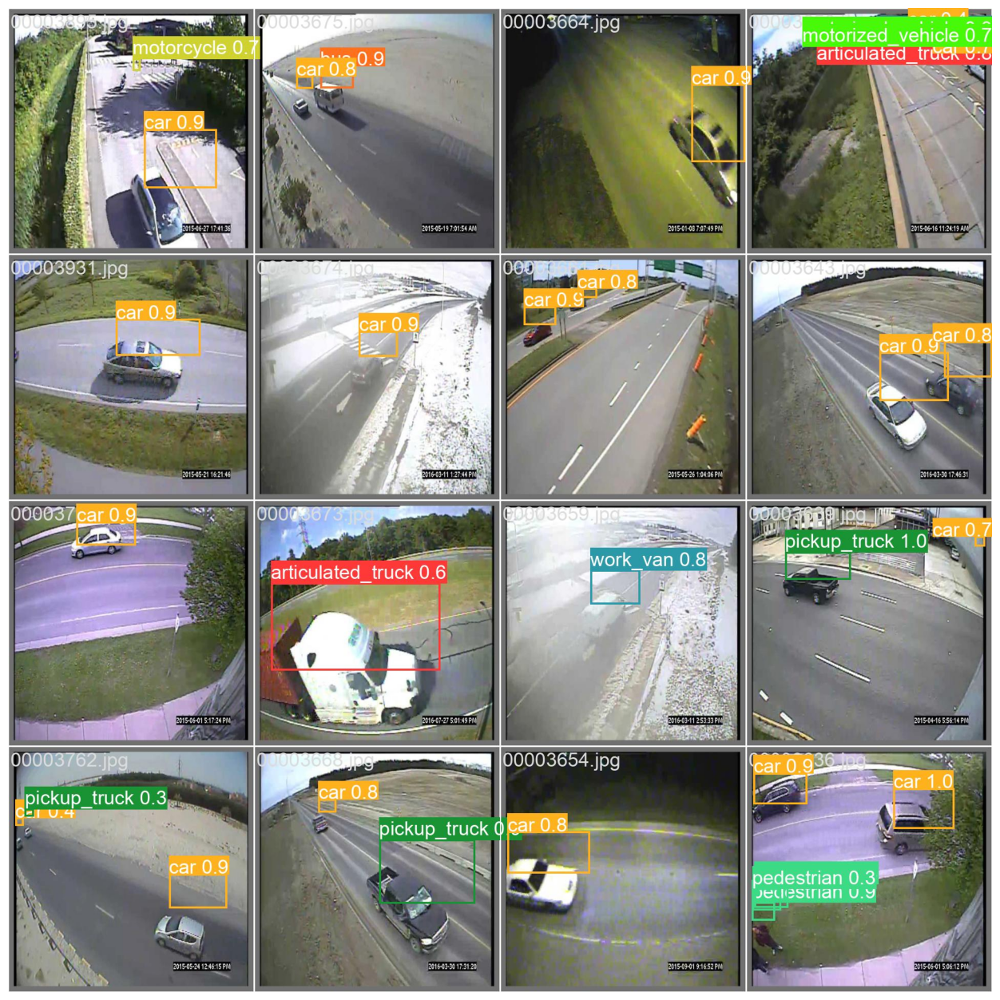

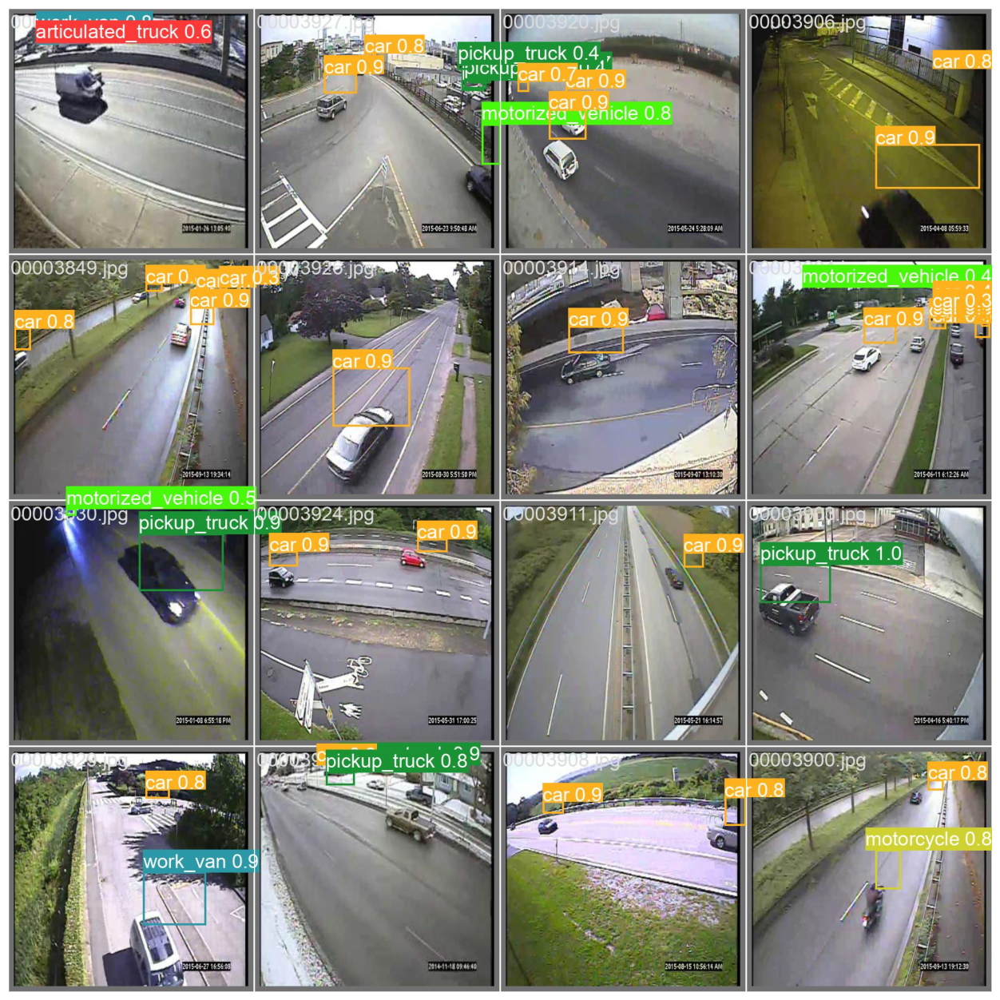

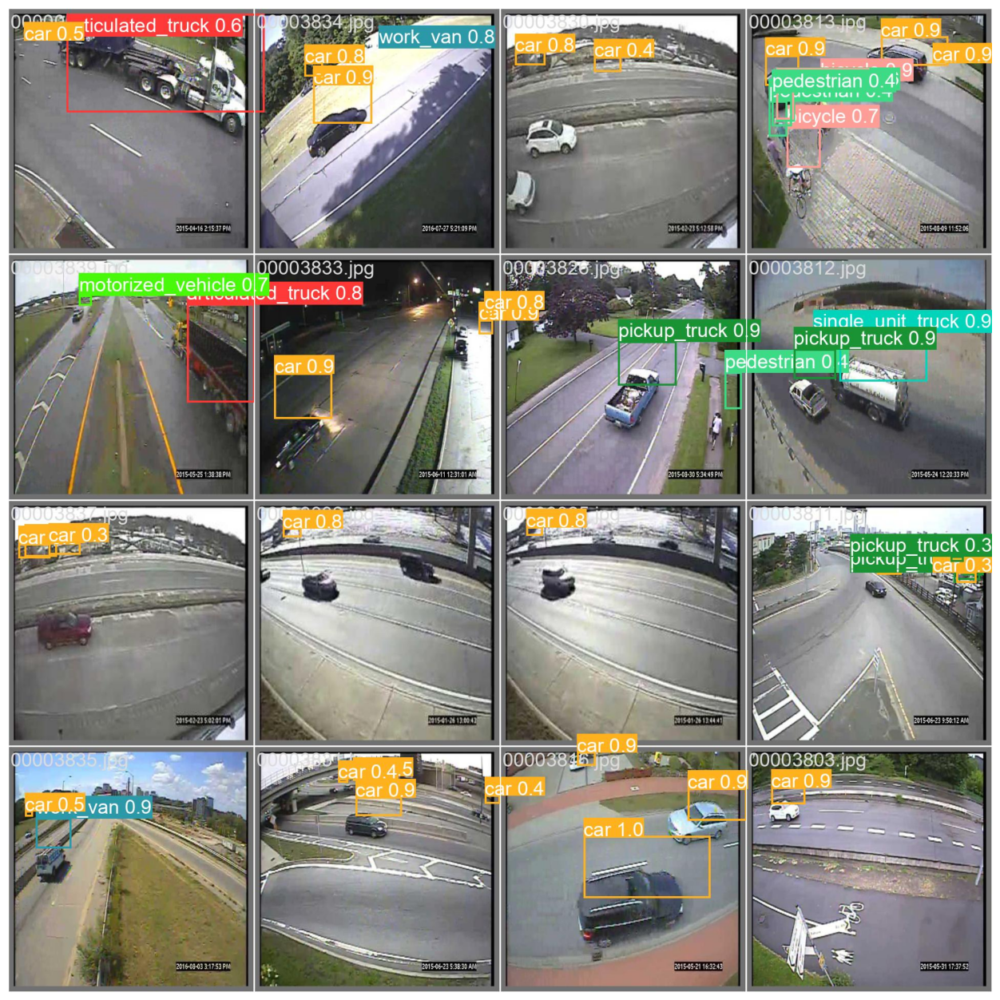

In [ ]:
RES_DIR = 'results_2'  # Replace with the correct folder name if needed
show_valid_results(RES_DIR)

Detected Objects and Classes:

Vehicle Types: Various vehicle types have been detected, including:

Cars: Labeled in orange with confidence scores ranging from 0.3 to 1.0.
Trucks: Both articulated trucks and single-unit trucks are detected, labeled in red or green with confidence scores between 0.6 and 0.9.

Vans: "Work van" and "pickup truck" classes are detected, labeled in green or blue with confidence scores between 0.3 and 0.9.

Motorized Vehicles: One frame shows a "motorized vehicle" label with a confidence score of 0.7.

Non-Vehicle Entities: Non-vehicle entities detected include:

Pedestrians: Labeled in green with confidence scores between 0.4 and 0.5.
Bicycles: Labeled with a confidence score of 0.7.

General Observations:

Confidence Scores:

Most of the detected objects have high confidence scores (0.8 or above), indicating that the model is confident in its detections for those objects.
A few lower confidence scores (e.g., 0.3 or 0.4) suggest some uncertainty in detecting objects like pedestrians or distant vehicles.

Bounding Boxes:

The bounding boxes for each object are slightly off but still in the general vicinity.
Some overlapping objects are detected, such as multiple cars in a single frame, where the model successfully identifies each car individually.

Class Labels:

The model is detecting multiple vehicle and non-vehicle classes, with clear differentiation between types like "pickup truck" and "single unit truck."
Some unusual class labels like "motorized vehicle" may represent the model’s generalized classification for objects not fitting into more specific categories.